# Energy Efficiency
https://archive.ics.uci.edu/ml/datasets/energy+efficiency

We perform energy analysis using 12 different building shapes simulated in Ecotect. The buildings differ with respect to the glazing area, the glazing area distribution, and the orientation, amongst other parameters. We simulate various settings as functions of the afore-mentioned characteristics to obtain 768 building shapes. The dataset comprises 768 samples and 8 features, aiming to predict two real valued responses. It can also be used as a multi-class classification problem if the response is rounded to the nearest integer.

The dataset contains eight attributes (or features, denoted by X1...X8) and two responses (or outcomes, denoted by y1 and y2). The aim is to use the eight features to predict each of the two responses.


Specifically:
- X1 Relative Compactness
- X2 Surface Area
- X3 Wall Area
- X4 Roof Area
- X5 Overall Height
- X6 Orientation
- X7 Glazing Area
- X8 Glazing Area Distribution
- y1 Heating Load
- y2 Cooling Load

In [ ]:
# To run .xlsx files you need the xlrd library
!pip install xlrd

In [5]:
import numpy as np
import pandas as pd

data = pd.read_excel('data/ENB2012_data.xlsx')
data.columns = ["Relative Compactness", "Surface Area", "Wall Area", "Roof Area", "Overall Height", "Orientation", "Glazing Area", "Glazing Area Distribution", "Heating Load", "Cooling Load"]
data.head()

,Relative Compactness,Surface Area,Wall Area,Roof Area,Overall Height,Orientation,Glazing Area,Glazing Area Distribution,Heating Load,Cooling Load
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28


In [15]:
data.columns

'Relative Compactness'

In [29]:
data.dtypes.value_counts()

float64    8
int64      2
dtype: int64

In [17]:
data.describe()

,Relative Compactness,Surface Area,Wall Area,Roof Area,Overall Height,Orientation,Glazing Area,Glazing Area Distribution,Heating Load,Cooling Load
count,768.000000,768.000000,768.000000,768.000000,768.00000,768.000000,768.000000,768.00000,768.000000,768.000000
mean,0.764167,671.708333,318.500000,176.604167,5.25000,3.500000,0.234375,2.81250,22.307195,24.587760
std,0.105777,88.086116,43.626481,45.165950,1.75114,1.118763,0.133221,1.55096,10.090204,9.513306
min,0.620000,514.500000,245.000000,110.250000,3.50000,2.000000,0.000000,0.00000,6.010000,10.900000
25%,0.682500,606.375000,294.000000,140.875000,3.50000,2.750000,0.100000,1.75000,12.992500,15.620000
50%,0.750000,673.750000,318.500000,183.750000,5.25000,3.500000,0.250000,3.00000,18.950000,22.080000
75%,0.830000,741.125000,343.000000,220.500000,7.00000,4.250000,0.400000,4.00000,31.667500,33.132500
max,0.980000,808.500000,416.500000,220.500000,7.00000,5.000000,0.400000,5.00000,43.100000,48.030000


In [18]:
data.isna().any()

Relative Compactness         False
Surface Area                 False
Wall Area                    False
Roof Area                    False
Overall Height               False
Orientation                  False
Glazing Area                 False
Glazing Area Distribution    False
Heating Load                 False
Cooling Load                 False
dtype: bool

Plotting

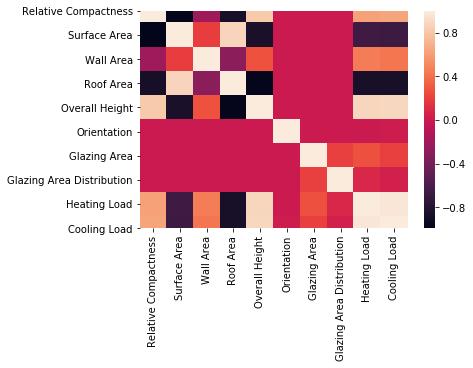

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

correlation = data.corr()
sns.heatmap(correlation)

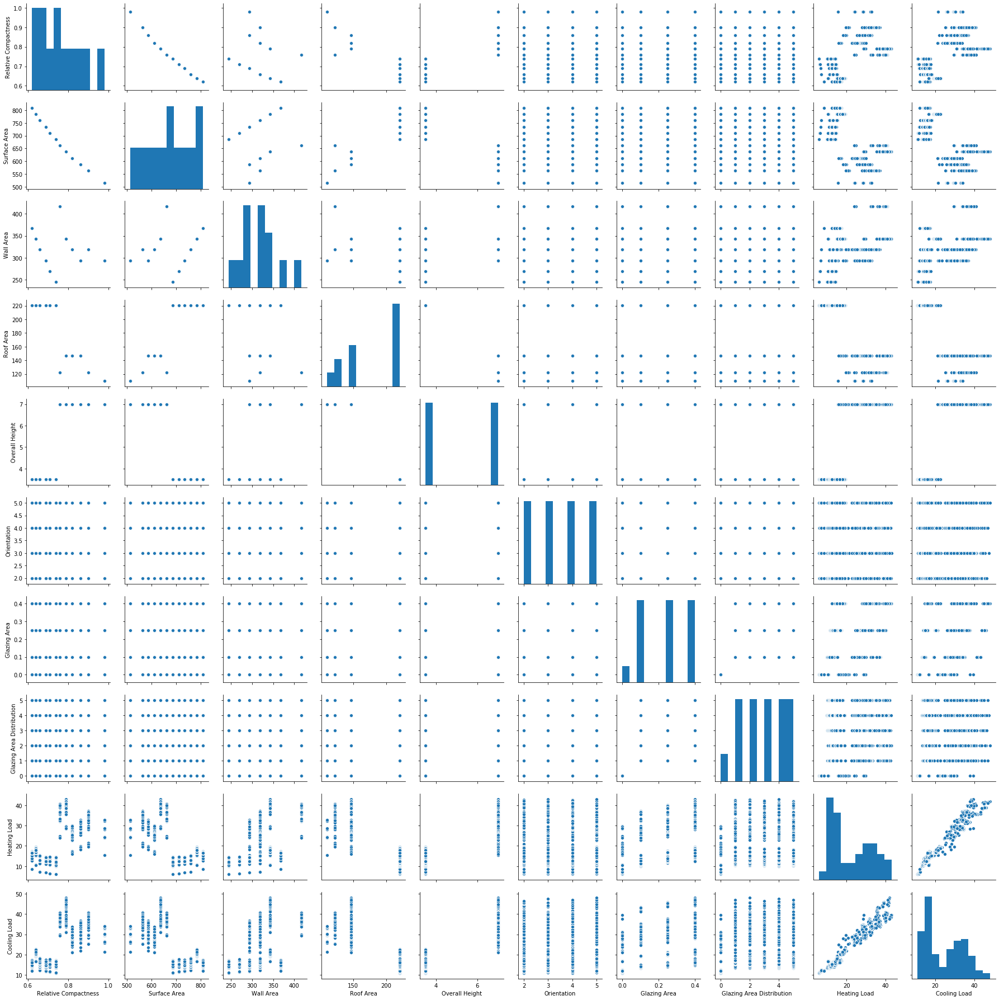

In [20]:
sns.pairplot(data)

Relative Compactness


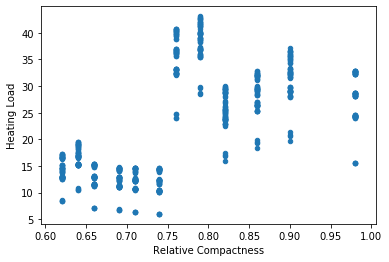

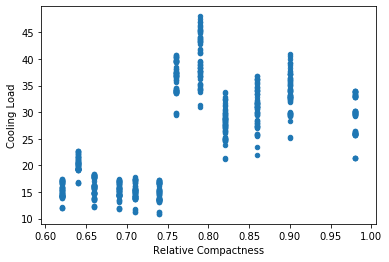

Surface Area


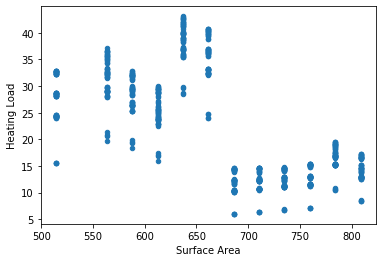

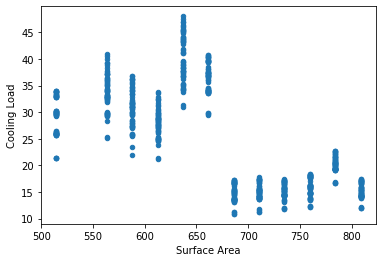

Wall Area


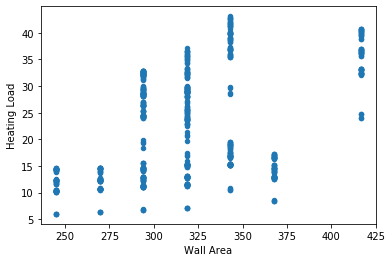

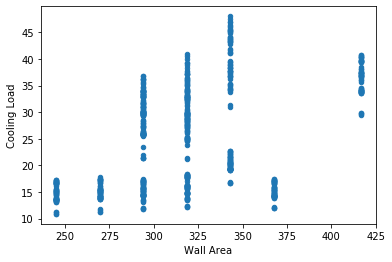

Roof Area


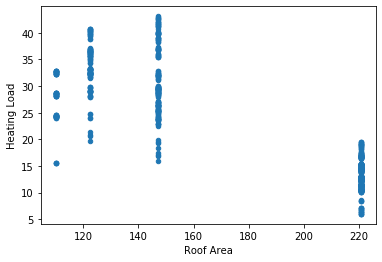

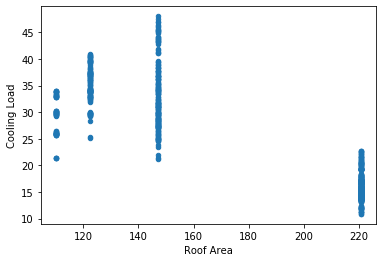

Overall Height


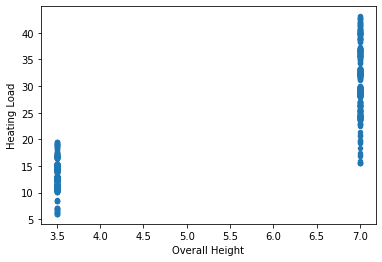

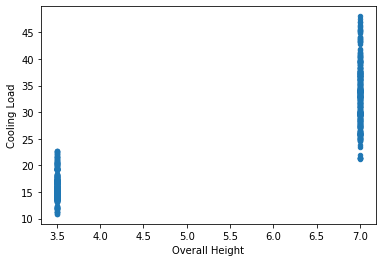

Orientation


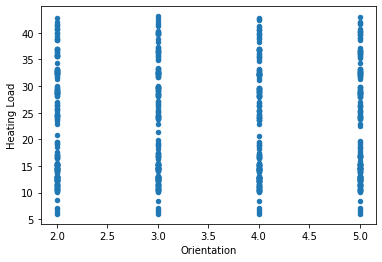

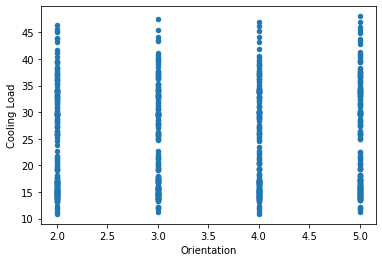

Glazing Area


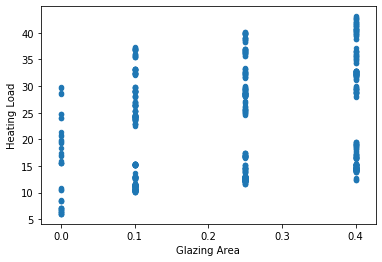

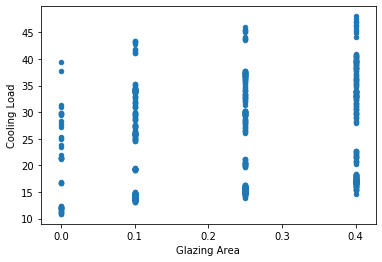

Glazing Area Distribution


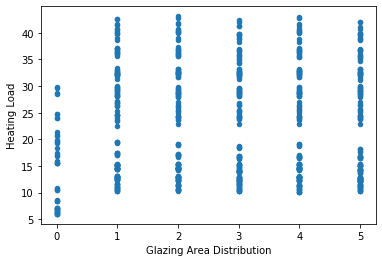

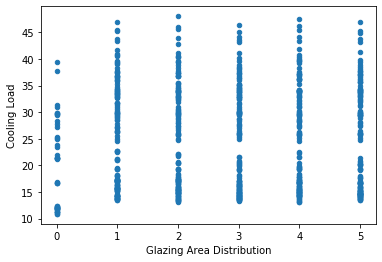

In [21]:
for column in data.columns[:-2]:
    print(column)
    data.plot(kind='scatter', x=column, y='Heating Load')
    data.plot(kind='scatter', x=column, y='Cooling Load')
    plt.show()

Splitting the data

In [22]:
X = data.iloc[:,0:8]
y = data.iloc[:,8]

In [23]:
X.shape, y.shape

((768, 8), (768,))

In [37]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [38]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((576, 8), (192, 8), (576,), (192,))

In [39]:
X_train.head()

,Relative Compactness,Surface Area,Wall Area,Roof Area,Overall Height,Orientation,Glazing Area,Glazing Area Distribution
762,0.64,784.0,343.0,220.5,3.5,4,0.40,5
127,0.71,710.5,269.5,220.5,3.5,5,0.10,2
564,0.66,759.5,318.5,220.5,3.5,2,0.40,1
375,0.66,759.5,318.5,220.5,3.5,5,0.25,2
663,0.66,759.5,318.5,220.5,3.5,5,0.40,3


In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score

lr = LinearRegression(n_jobs = -1).fit(X_train, y_train)
y_pred = lr.predict(X_train)
y_pred

array([18.38561877,  9.18169855, 17.08254985, 14.11178515, 17.21592805,
       25.49827224,  9.91860182, 31.35738416, 15.90377801, 12.63395403,
        7.59894489, 15.353054  , 28.38165044, 32.9921766 ,  9.15079851,
       16.93939359, 10.87121324, 13.321804  , 28.00263782, 13.72972172,
       28.77176187, 27.37763782, 10.65647885, 12.69112664, 25.63165044,
       31.10678072, 30.06209   , 11.56743842, 32.49085885, 12.11178515,
       16.28279064, 11.52981114, 29.52009415, 30.72741514, 33.83294411,
       13.03923923, 15.47805698, 17.63561877,  7.67052302, 33.30938915,
       13.07616957, 19.24752503, 10.83053515, 17.7071969 , 34.10844545,
       26.18978785, 30.41020259, 18.4571969 , 36.51739629, 32.92059847,
       26.57857854, 29.06950339, 16.86781545, 33.76033286, 31.28686732,
       25.77271229, 29.48919411, 17.46156247, 30.79559847, 18.03750618,
       28.59638484, 30.13366813, 17.18502801, 28.03353785, 17.38998434,
       14.4259469 , 31.13768075, 11.6729674 , 33.06375473, 32.01

In [48]:
print('Coefficients: ', lr.coef_)
print('Intercept: ', lr.intercept_)

Coefficients:  [-5.58577953e+01  5.02829938e+11 -5.02829938e+11 -1.00565988e+12
  4.03293800e+00 -7.15781301e-02  1.95339107e+01  1.74056295e-01]
Intercept:  71.71655252601408


In [49]:
print('Train score: ', lr.score(X_train, y_train))

Train score:  0.9174598839668615


In [50]:
print('Test score: ', lr.score(X_test, y_test))

Test score:  0.9112792480617562


In [52]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_jobs = -1).fit(X_train, y_train)
y_pred = knn.predict(X_train)
y_pred

array([17.384 , 12.602 , 14.13  , 12.78  , 13.99  , 26.064 , 11.368 ,
       28.344 , 13.614 , 11.666 ,  9.71  , 16.9   , 24.216 , 34.368 ,
       11.404 , 14.112 , 12.018 , 12.874 , 25.424 , 13.702 , 28.644 ,
       31.482 , 13.242 , 12.948 , 27.708 , 26.158 , 32.594 , 11.706 ,
       38.962 , 13.264 , 13.384 , 12.844 , 37.938 , 33.114 , 34.912 ,
       14.006 , 15.086 , 14.582 ,  8.838 , 33.578 , 12.628 , 15.2   ,
       12.288 , 13.858 , 27.542 , 27.516 , 32.95  , 17.542 , 36.512 ,
       33.824 , 28.146 , 37.194 , 14.09  , 27.048 , 30.23  , 22.81  ,
       37.36  , 14.692 , 29.37  , 17.574 , 26.18  , 33.34  , 14.042 ,
       24.796 , 14.376 , 12.976 , 25.006 , 12.498 , 34.744 , 30.846 ,
       12.782 , 12.95  , 27.868 , 29.932 , 22.83  , 29.46  , 28.474 ,
       24.766 , 16.704 , 16.228 , 27.534 , 36.536 , 40.212 , 13.02  ,
       16.566 , 34.762 , 38.796 , 12.13  , 10.968 , 12.67  , 13.628 ,
       24.966 , 32.146 , 13.788 , 25.442 , 29.286 , 26.566 , 32.722 ,
       12.57  , 16.3

In [57]:
print('Metric: ', knn.effective_metric_)

Params:  euclidean


In [58]:
print('Train score: ', knn.score(X_train, y_train))

Train score:  0.9656553697443954


In [59]:
print('Test score: ', knn.score(X_test, y_test))

Test score:  0.94541767913929


In [60]:
train_scores, test_scores=[], []

for n in range(1, 11):
    knn = KNeighborsRegressor(n_neighbors=n).fit(X_train, y_train)
    train_scores.append(knn.score(X_train, y_train))
    test_scores.append(knn.score(X_test, y_test))

Text(0.5, 1.0, 'Train Scores for KNeighbourRegressor')

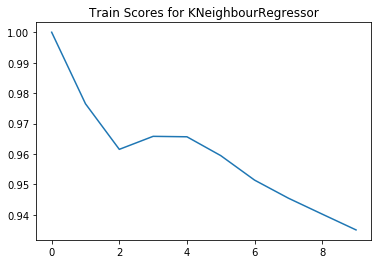

In [63]:
plt.plot(train_scores)
plt.title("Train Scores for KNeighbourRegressor")

Text(0.5, 1.0, 'Test Scores for KNeighbourRegressor')

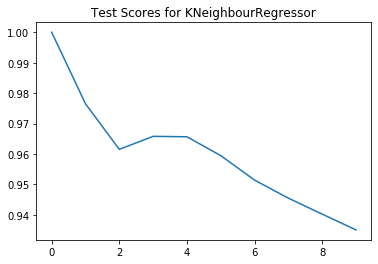

In [64]:
plt.plot(train_scores)
plt.title("Test Scores for KNeighbourRegressor")